# Practical Session : Mathematical Morphology and Histogram manipulations

The aim of this practical work is to get acquainted with mathematical morphology
transformations. Applying different operations with several structuring elements on
simple images will allow you understanding the actions, effects and properties of the
operations, the role of the structuring element, as well as the need for appropriate
pre-processing depending on the application at hand.

In this session, we will mainly focus on functions from the skimage.morphology package.

First, you have to download a set of images that you will use throughout the TP: https://partage.imt.fr/index.php/s/9YPTAzKsiXHQWH3

In [1]:
## imports
import matplotlib.pyplot as plt
import skimage.io as skio
import skimage
import numpy as np
import skimage.morphology as morpho
import skimage.segmentation as seg
student = True

#help(morpho)

## Mathematical morphology

### The structuring element
The basic idea in mathematical orphology is to probe an image with a simple, pre-defined shape, drawing conclusions on how this shape fits or misses the shapes in the image. This simple "probe" is called the structuring element. For example, it can take the shape of a square, a disk or a diamond, with a predefined radius.

Use the function morpho.disk() of the morpho library to visualize a disk structuring element of radius 5. 

[[0 0 1 0 0]
 [0 1 1 1 0]
 [1 1 1 1 1]
 [0 1 1 1 0]
 [0 0 1 0 0]]


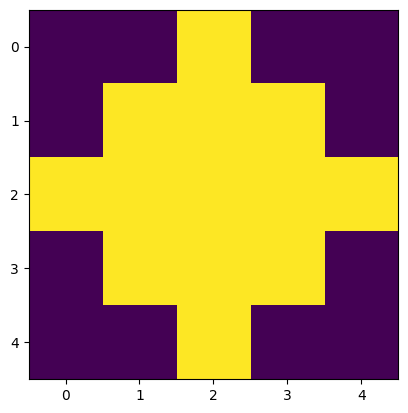

In [2]:
if student :
  strell = morpho.disk(2)

print(strell)
plt.imshow(strell)
plt.show()

Find a way to create a vertical line as a structuring element with parameter length l :

[[0. 0. 1. 1. 0. 0. 0.]
 [0. 0. 1. 1. 0. 0. 0.]
 [0. 0. 1. 1. 0. 0. 0.]
 [0. 0. 1. 1. 0. 0. 0.]
 [0. 0. 1. 1. 0. 0. 0.]
 [0. 0. 1. 1. 0. 0. 0.]
 [0. 0. 1. 1. 0. 0. 0.]]


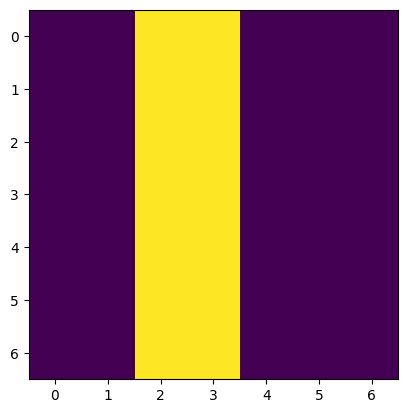

In [3]:
def line_strell(width,length):
  if student :
    n = max(width,length)
    strell = np.zeros((n,n))
    for i in range(n):
      for j in range(width):
        strell[i][(n-width)//2+j] = 1
  return strell

strell = line_strell(2,7)
print(strell)
plt.imshow(strell)
plt.show()

### Binary Morphology
In this section, we will work on a cyto-image. Make sure to properly load the "cell.tif" image. Apply a thresholding of level t = 150 to that image to turn it into a binary image. Visualize the result in greyscale, by using the imshow function.

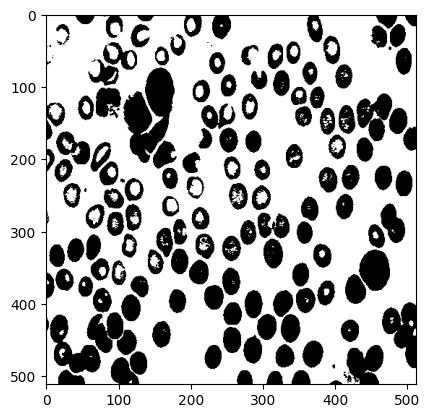

In [4]:
#load the cell image in grayscale and display it 
if student:
  img = skio.imread("images/cell.tif")
  (a,b) = np.shape(img) # Theresholding and display
  for i in range(a):
    for j in range(b):
      if img[i][j] < 150:
        img[i][j] = 0
      else:
        img[i][j] = 255
  plt.imshow(img,cmap="gray")
  plt.show()

We will first start by applying simple binary morphological operations on those images. You will try the following operations:
- erosion
- dilation
- opening
- closing

You will try to visualize the results by varying the structuring element and its size.  

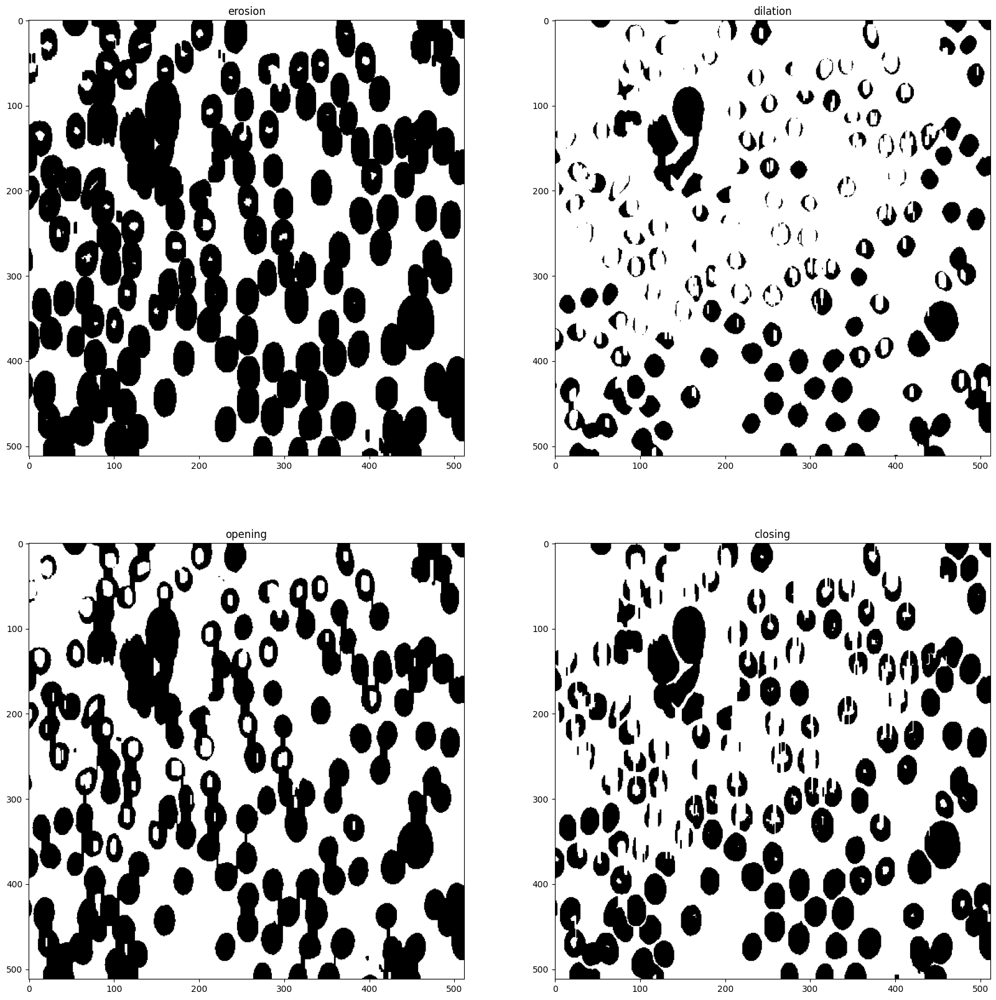

In [5]:
strell = line_strell(2,10)
fig,ax = plt.subplots(2, 2, figsize=(20,20))

dila = morpho.binary_dilation(img, footprint=strell, out=None)
eros = morpho.binary_erosion(img, footprint=strell, out=None)
clos = morpho.binary_closing(img, footprint=strell, out=None)
ope = morpho.binary_opening(img, footprint=strell, out=None)

imgs = [eros,dila,ope,clos]# Add in this list the 4 images, obtained with the for operations
names = ["erosion","dilation","opening","closing"]
for i in range(4):
  ax[i//2,i%2].set_title(names[i])
  ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
plt.show()

# try your own structuring elements and make the size vary
if student :
  ...

- **Q** : What is the influence of the shape of the structuring element ?
- **A** : The shape of the structuring element will determine what kind of shape will still be visible after the operations
- **Q** : What is the influence of the size of the structuring element ?
- **A** : For the opening: the more the size of the structuring element is important, the more shape-liked structures on the final image will appear, for this exemple it is the jonction betwinn two cells, one above the over.
For the closing: the more the size of the structuring element is important, the more structures wich doesn't have these type of shapes will disappear. For this exemple, elements which are not long virtically (for exemple the up and down of the round cells) tend to disappear.

### Greyscale Morphology
In this section, we will use the bateau.tif image. Make sure to load it and visualize it in greyscale.


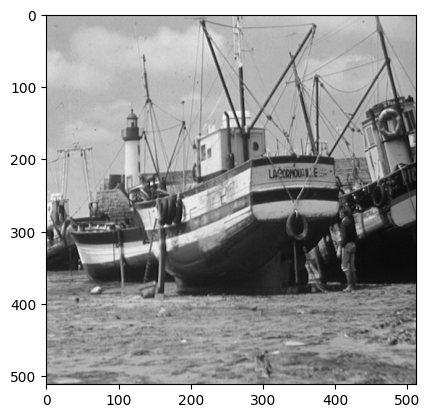

In [6]:
#load the bateau image in grayscale and display it 
if student:
  img = skio.imread("images/bateau.tif")
  plt.imshow(img, cmap = "gray")
  plt.show()

Apply the same 4 operations as before (dilation,erosion,opening,closing) and visualize the results. Try out different structuring elements and different sizes.

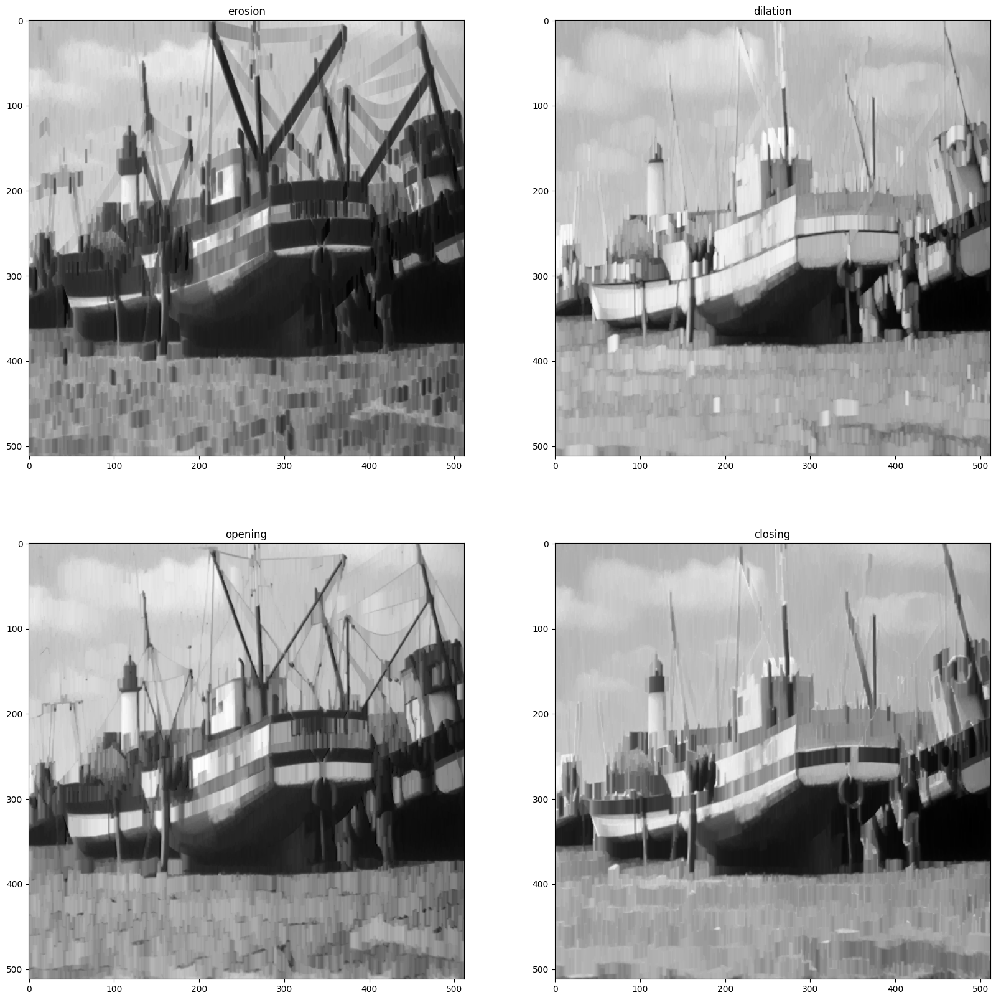

In [7]:
if student:
  ### start code
  strell = morpho.disk(3)
  strell = line_strell(2,16)
  fig,ax = plt.subplots(2, 2, figsize=(20,20))

  dila = morpho.dilation(img, footprint=strell, out=None)
  eros = morpho.erosion(img, footprint=strell, out=None)
  clos = morpho.closing(img, footprint=strell, out=None)
  ope = morpho.opening(img, footprint=strell, out=None)

  imgs = [eros,dila,ope,clos]# Add in this list the 4 images, obtained with the for operations
  names = ["erosion","dilation","opening","closing"]
  for i in range(4):
    ax[i//2,i%2].set_title(names[i])
    ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
  plt.show()
  ### end code

- **Q** : What is the influence of the shape and size parameters of the structuring element ?
- **A** : the greater the size, the more only shape-aliked structures will appear, thus if will take as structuring element a shape that is recurring in the image, the image will be less distort (deform) by the transformations, it is the case with the line_strell function. On the contrary, with the disk as structuring element, the image becomes blur.

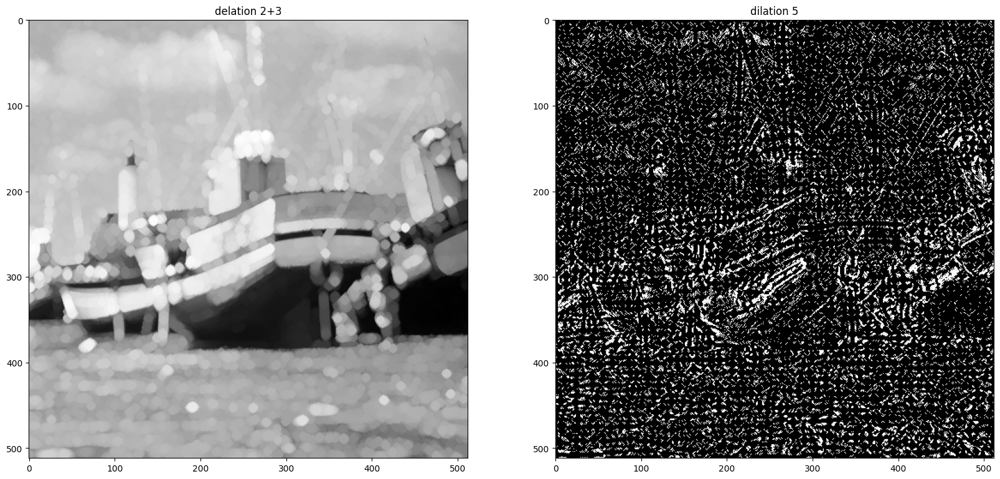

In [8]:
if student:
  ### start code
  strell = morpho.disk(2)
  strell2 = morpho.disk(3)
  strell3 = morpho.disk(5)
  fig,ax = plt.subplots(1, 2, figsize=(20,20))

  dila1 = morpho.dilation(img,strell)
  dila2 = morpho.dilation(dila1,strell2)
  names = ["delation 2+3","dilation 5"]
  dila3 = morpho.dilation(img,strell3)

  imgs = [dila2,dila3]
  diff = dila2-dila3
  
  ax[0].set_title(names[0])
  ax[0].imshow(imgs[0],cmap = "gray")

  ax[1].set_title(names[1])
  ax[1].imshow(diff,cmap = "gray")
  diff
  plt.show()

- **Q** : We then now try to illustrate the iterativity property. What is the
result of a dilation by a disk structuring element of size 2 followed by a dilation by a
disk structuring element of size 3? Compare it with a dilation by a disk of size 5. Explain.
- **A** : On remarque que la différence entre les deux images n'est pas tout à fait nulle (même si il y a très peu de différence), c'est notamment au niveau des contours qu'il y a une différence. En effet au niveau des contours il y a des pixels très clairs à côté de pixels très foncés, En effet on ne dilate pas en réalisant les mêmes formes en faisant des dilatations séquentielles.

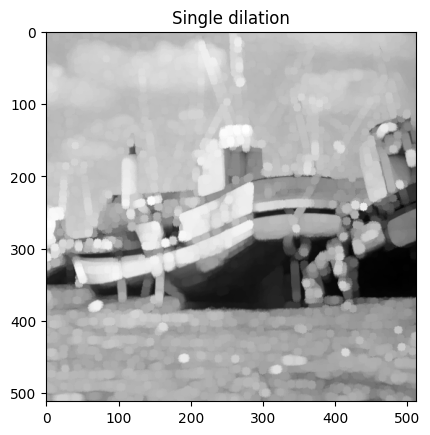

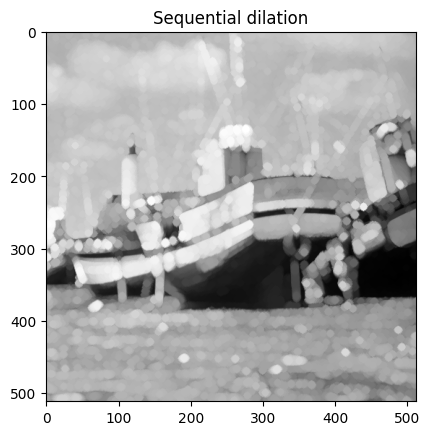

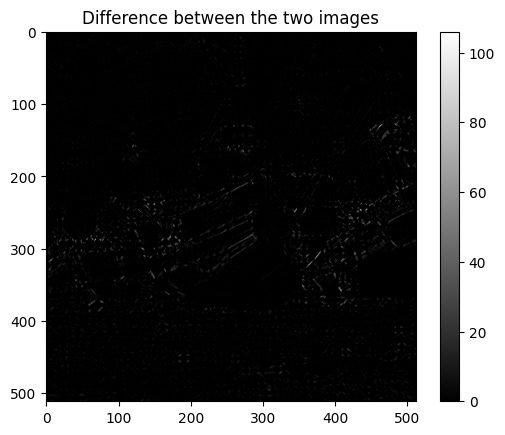

195761


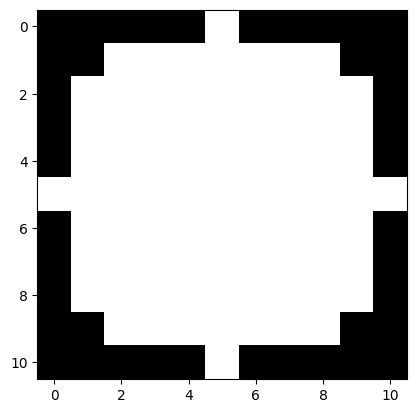

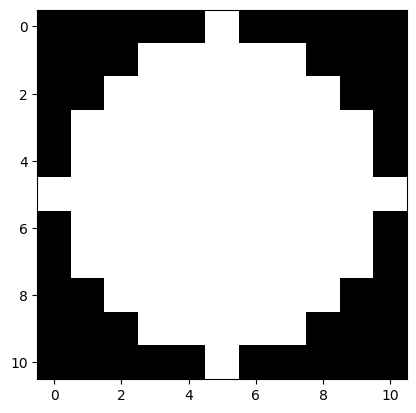

In [9]:
if student:
  ### start code
  dilation = morpho.dilation(img,morpho.disk(5))
  plt.imshow(dilation,cmap = "gray")
  plt.title("Single dilation")
  plt.show()

  sequential_dilation = morpho.dilation(morpho.dilation(img,morpho.disk(2)),morpho.disk(3))
  plt.imshow(sequential_dilation,cmap = "gray")
  plt.title("Sequential dilation")
  plt.show()

  plt.imshow(dilation-sequential_dilation,cmap = "gray")
  plt.title('Difference between the two images')
  plt.colorbar()
  plt.show()
  print(np.sum(np.abs(dilation-sequential_dilation)))

  plt.imshow(morpho.disk(5), cmap="gray")
  plt.show()
  plt.imshow(morpho.dilation(np.pad(morpho.disk(2),((3,3),(3,3))),morpho.disk(3)), cmap="gray")
  plt.show()

- **Q:** Plot the result of an opening by a disk structuring element of size 2 followed by
an opening by a disk structuring element of size 3? 
Compare with a dilation of the image by (a disk of size 2 dilated by a disk of size 3). Please note that you might have to use the np.pad function to perform this. Conclude.
- **A:** We notice that that the difference betwinn the two images is null.
Thus, we have :$ D(D(X,B_2),B_3) = D(X,D(B_2,B_3))$

[[0 0 0 0 0 1 0 0 0 0 0]
 [0 0 0 1 1 1 1 1 0 0 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [1 1 1 1 1 1 1 1 1 1 1]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 0 0 1 1 1 1 1 0 0 0]
 [0 0 0 0 0 1 0 0 0 0 0]]


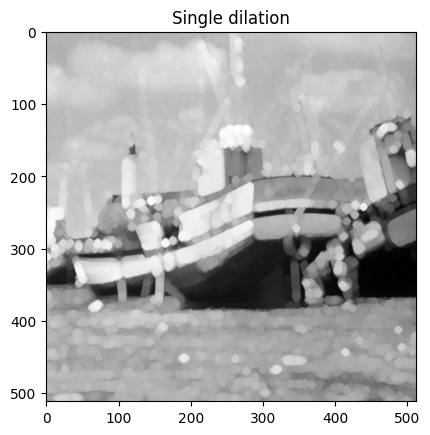

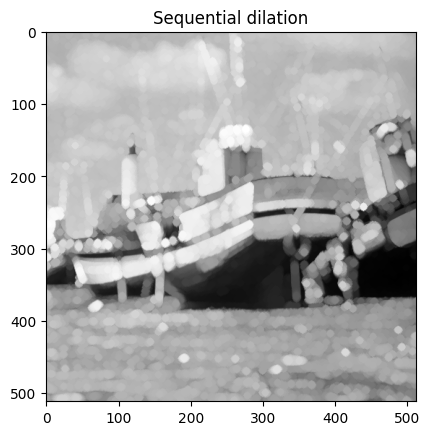

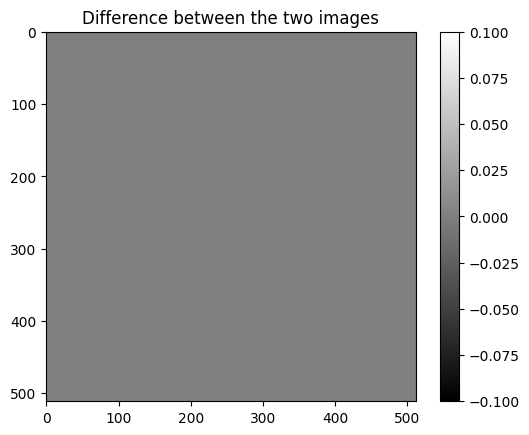

0


In [10]:
if student:
 # First create the sequential structuring element, that is a disk of size 2 dilated by a disk of size 3
  sqr_strell = morpho.disk(2)
  sqr_strell = np.pad(sqr_strell,((3,3),(3,3)))
  sqr_strell = morpho.dilation(sqr_strell, morpho.disk(3))
  print(sqr_strell)

  # Use it to perform the image dilation
  dilation = morpho.dilation(img, sqr_strell)
  plt.imshow(dilation,cmap = "gray")
  plt.title("Single dilation")
  plt.show()
  
  # Compare it with the sequential dilation
  sequential_dilation = morpho.dilation(morpho.dilation(img,morpho.disk(2)),morpho.disk(3))
  plt.imshow(sequential_dilation,cmap = "gray")
  plt.title("Sequential dilation")
  plt.show()
    
  plt.imshow(dilation-sequential_dilation,cmap = "gray")
  plt.title('Difference between the two images')
  plt.colorbar()
  plt.show()
  print(np.sum(np.abs(dilation-sequential_dilation)))

- **Q:** How can you illustrate the idempotence of closing ? Show your illustration in the following cell.
- **A:** On montre que que appliquer deux fermetures revient à en appliquer qu'une seule.


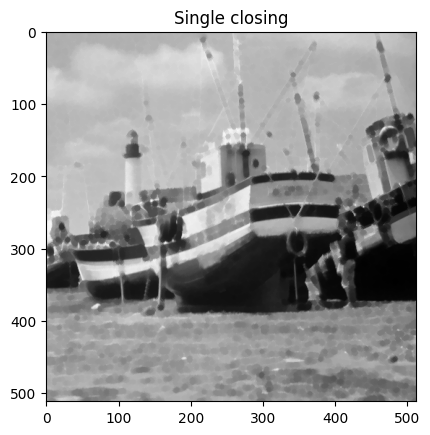

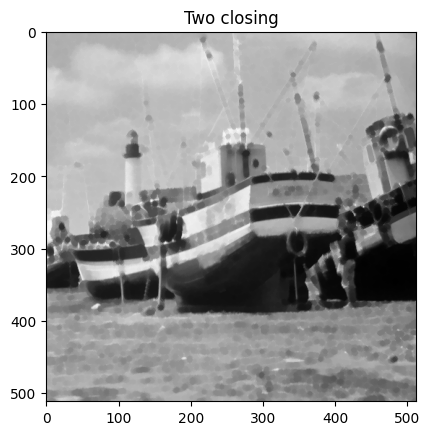

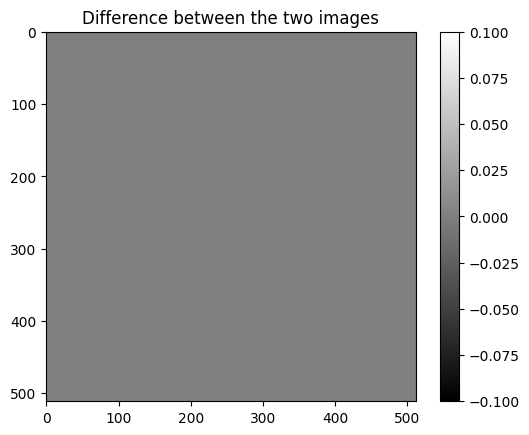

0


In [60]:
if student :
  ### start code
  closed = morpho.closing(img, morpho.disk(3))
  plt.imshow(closed,cmap = "gray")
  plt.title("Single closing")
  plt.show()

  closed2 = morpho.closing(closed, morpho.disk(3))
  plt.imshow(closed2,cmap = "gray")
  plt.title("Two closing")
  plt.show()

  plt.imshow(closed-closed2,cmap = "gray")
  plt.title('Difference between the two images')
  plt.colorbar()
  plt.show()
  print(np.sum(np.abs(closed-closed2)))
  ### end code

- **Q** : Perform a top-hat transform in the following cell (difference between the image and its opening).
Comment the result depending on the choice of the structuring element.
- **A** : Si on prend un élément structurant de grande taille, (morpho.disk(20) par exemple), on remarque que l'ouverture supprime (ou diminue) les zones de très grande uniformité ayant la forme de l'élément structurant.

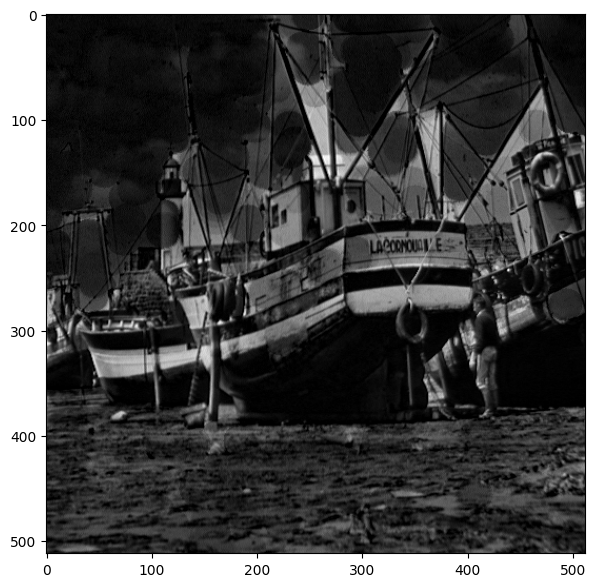

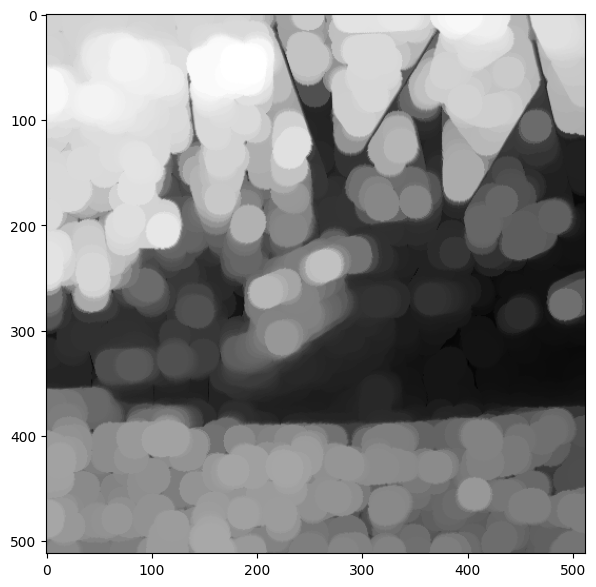

In [61]:
if student:
  ### start code
  strell = morpho.disk(15)
  #strell = line_strell(3,52)
  top_hat = (img - morpho.opening(img,strell))
plt.figure(figsize = (7,7))
plt.imshow(top_hat,cmap = "gray")
plt.show()
plt.figure(figsize = (7,7))
plt.imshow(morpho.opening(img,strell),cmap = "gray")

plt.show()

- **Q** : Perform a dual top-hat transform in the following cell (difference between the closing and the image).
Comment the result depending on the choice of the structuring element.
- **A** : On remarque que si l'élément structurant et de taille très faible, le dual top-hat ressemblera à un tracé de contours, car la fermeture ressemblera beaucoup à l'image originale. Pour un objet de grande taille, on remarque qu'il y a des inversions de couleurs aux endroits où les deux couleurs sont présentes (les bandes sur le bateau notamment).

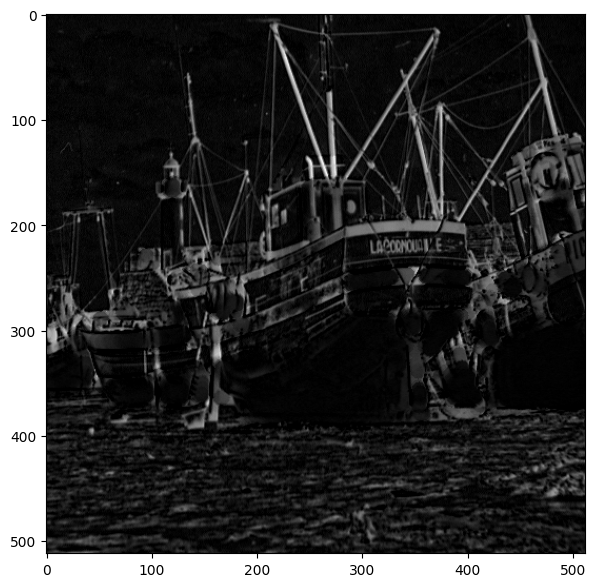

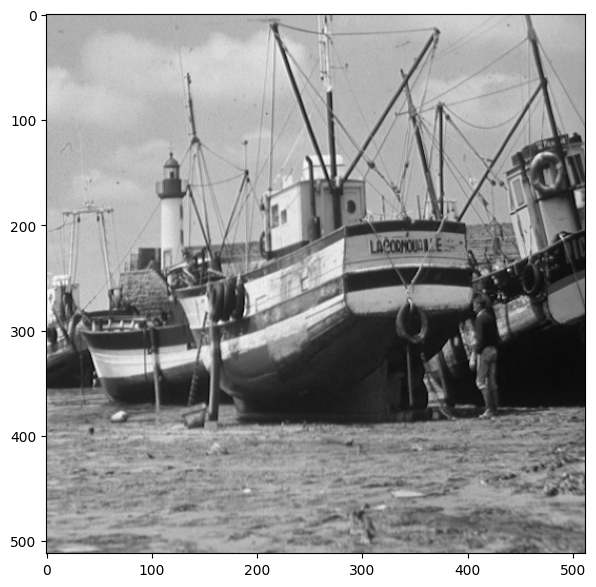

In [70]:
if student:
  ### start code
  strell = morpho.disk(7)
  #strell = line_strell(1,12)
  dual_top_hat =  -np.abs(img - morpho.closing(img,strell))
plt.figure(figsize = (7,7))
plt.imshow(dual_top_hat,cmap = "gray")
plt.show()
plt.figure(figsize = (7,7))
plt.imshow(img,cmap = "gray")
plt.show()

### Alternating Filters
- **Q**: Perform alternate sequential filters, for instance by performing sequential opening and then closing by squares of radius ranging from 1 to 5. Also try out your own combinations. What kind of filtering can be expected from such
operations?
- **A**: Ce genre d'opérations peut servir à effectuer des filtrages "passe-bande", c'est-à-dire qui ne floue pas les principaux contours mais qui vont filtrer certaines frécquences trop élevées, comme ici les lignes représentants les fenêtres des bâtiments.

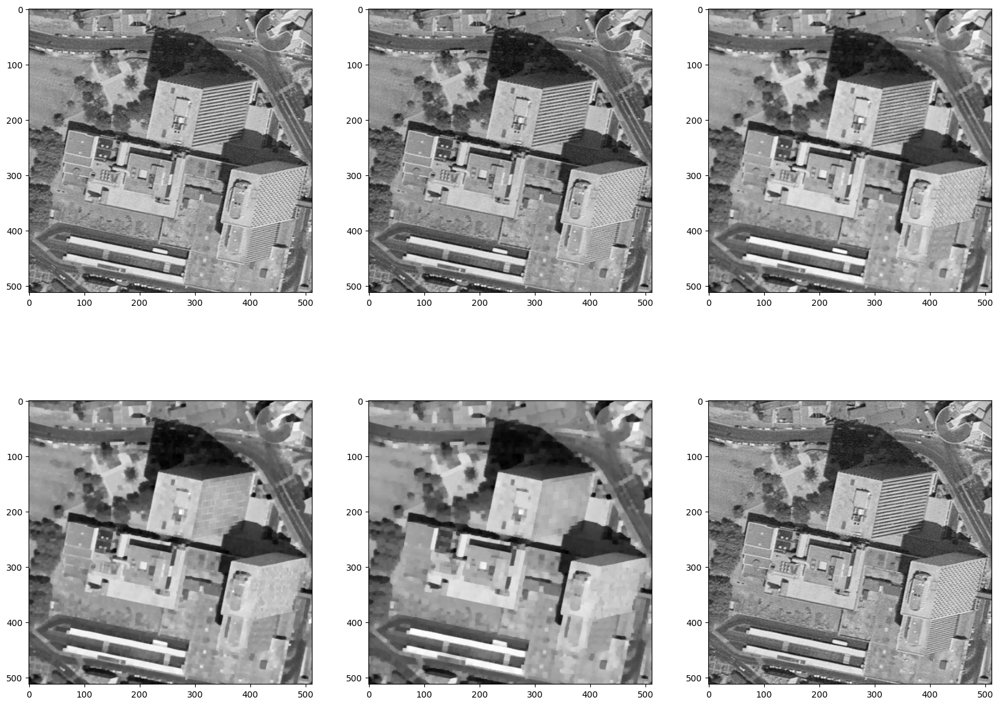

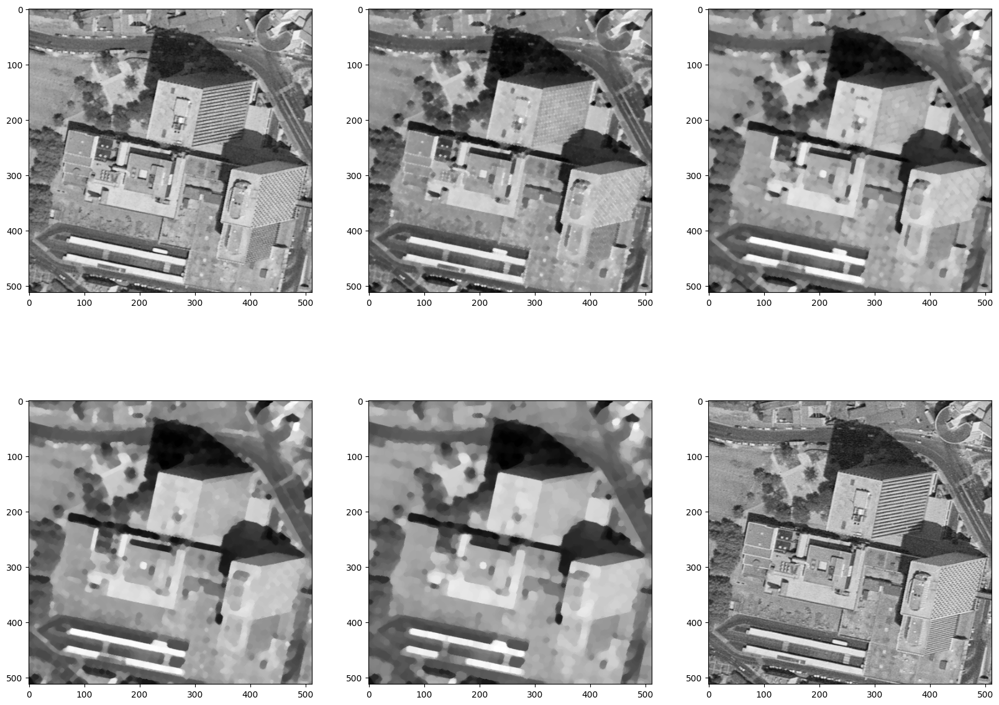

In [73]:
# Example
img = skio.imread("images/montreuil.tif")

# Structuring elements
se1=np.ones((1,1))
se2=np.ones((2,2))
se3=np.ones((3,3))
se4=np.ones((4,4))
se5=np.ones((5,5))

# Images
fas1=morpho.opening(img,se1)
fas2=morpho.closing(fas1,se2)
fas3=morpho.opening(fas2,se3)
fas4=morpho.closing(fas3,se4)
fas5=morpho.opening(fas4,se5)

fig,ax = plt.subplots(2,3,figsize = (20,15))
ax[0,0].imshow(fas1,cmap = "gray")
ax[0,1].imshow(fas2,cmap = "gray")
ax[0,2].imshow(fas3,cmap = "gray")
ax[1,0].imshow(fas4,cmap = "gray")
ax[1,1].imshow(fas5,cmap = "gray")
ax[1,2].imshow(img,cmap = "gray")
plt.show()

#Try you own
if student :
  se1=morpho.disk(1)
  se2=morpho.disk(2)
  se3=morpho.disk(3)
  se4=morpho.disk(4)
  se5=morpho.disk(5)

  # Images
  fas1=morpho.opening(img,se1)
  fas2=morpho.closing(fas1,se2)
  fas3=morpho.opening(fas2,se3)
  fas4=morpho.closing(fas3,se4)
  fas5=morpho.opening(fas4,se5)

  fig,ax = plt.subplots(2,3,figsize = (20,15))
  ax[0,0].imshow(fas1,cmap = "gray")
  ax[0,1].imshow(fas2,cmap = "gray")
  ax[0,2].imshow(fas3,cmap = "gray")
  ax[1,0].imshow(fas4,cmap = "gray")
  ax[1,1].imshow(fas5,cmap = "gray")
  ax[1,2].imshow(img,cmap = "gray")
  plt.show()
   

### Segmentation
 - **Q** : Apply a morphological gradient to the image cell.tif (difference between
dilation and erosion with a structuring element of radius1). What do you observe ?

- **A**: (code in the following cell) It is similar to a gradient.

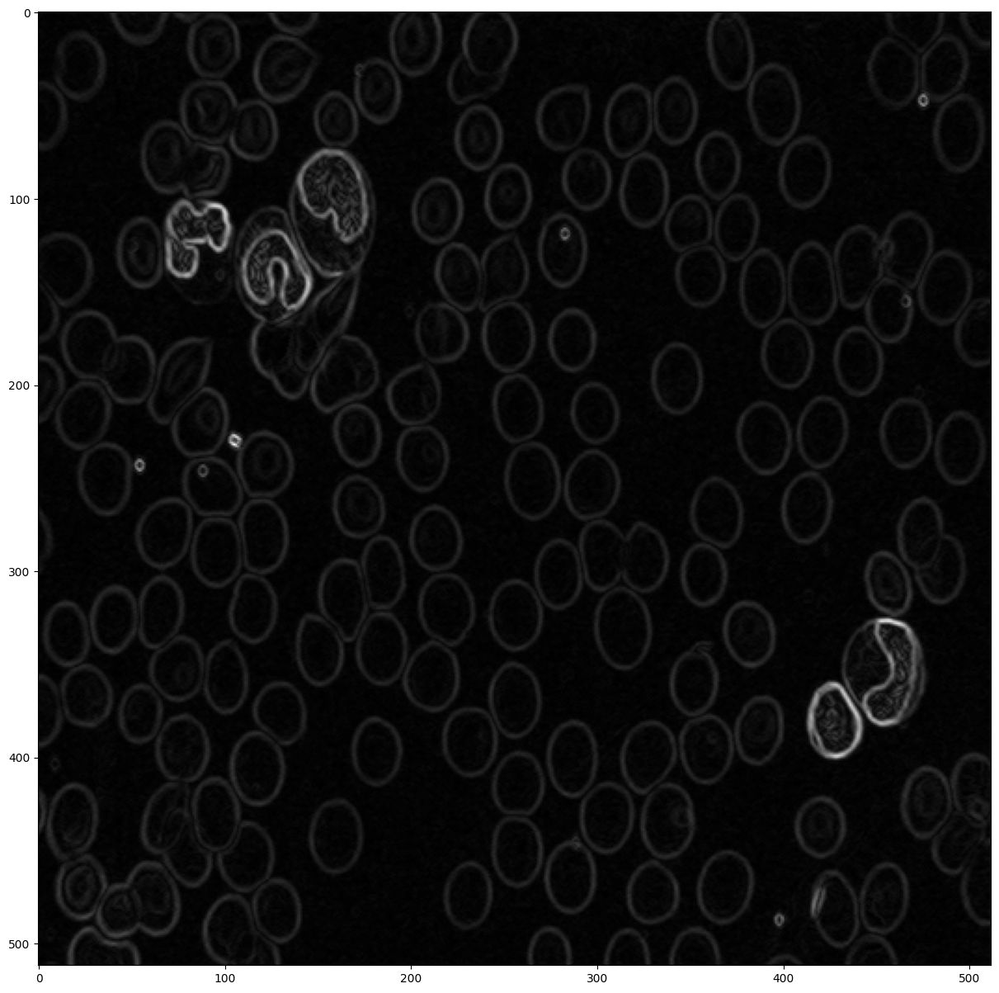

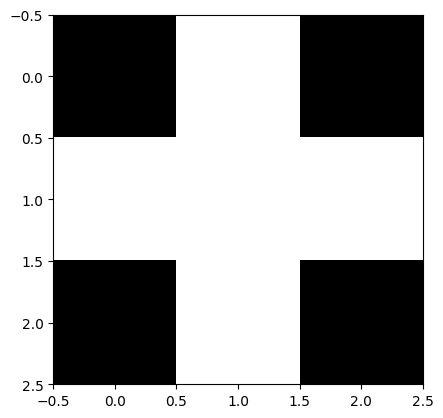

In [77]:
if student : 
  img = skio.imread("images/cell.tif")
  morpho_grad = morpho.dilation(img,morpho.disk(1))-morpho.erosion(img,morpho.disk(1))
plt.figure(figsize=(15,15))
plt.imshow(morpho_grad,cmap = "gray")
plt.show()
plt.imshow(morpho.disk(1),cmap = "gray")
plt.show()


- **Q** : Try to threshold the gradient with a value of 25 for instance. Why is it difficult to find an appropriate threshold value ?
- **A** : (code in the next cell) C'est difficile de trouver un seuil approprié car on voit que pour un seuil de 25, seul quelques contours très marqué apparaissent, et celui-ci a déjà une épaisseur assez importante (de plusieurs pixels)

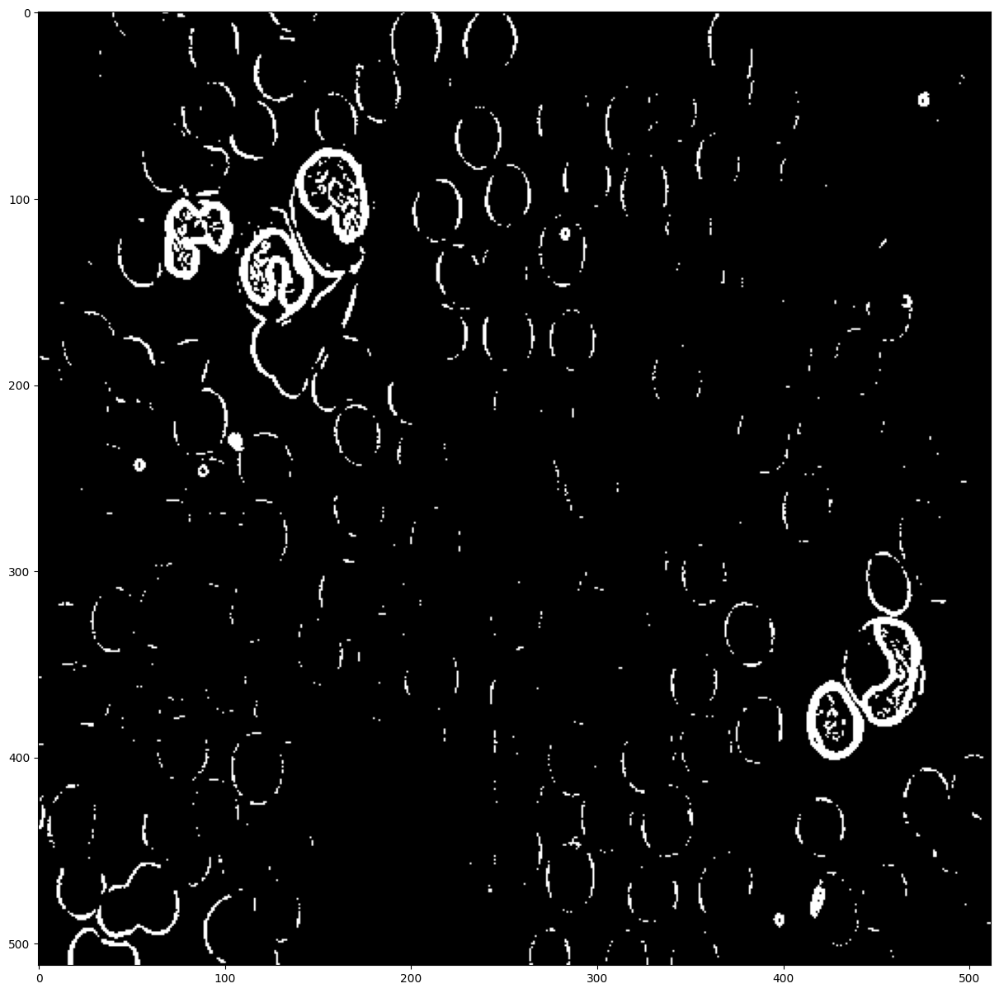

In [83]:
if student :
  thresh_grad = (morpho_grad>15)*255
plt.figure(figsize=(15,15))
plt.imshow(thresh_grad,cmap  ="gray")
plt.show()

- **Q** Apply the watershed algorithm to the gradient image using morpho.watershed(morpho_grad,k) ;
What do you observe ? 
- **A** :(code in the next cell) L'algorithme attribue des couleurs différentes au zone de l'image selon si elles sont séparées par des contours.
- **Q** Try to change the parameter k ; what is the role of that parameter ?
- **A** :(code in the next cell) k donne à peu près le nombre de zones différentes avec lesquels on veut segmenter l'image.

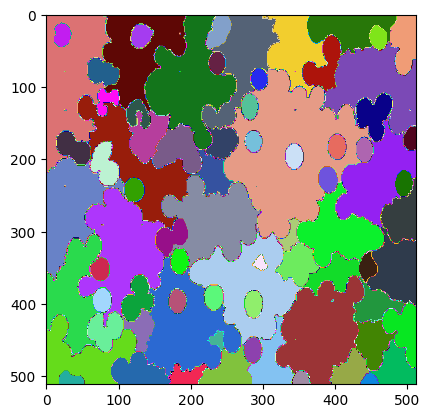

In [106]:
import matplotlib
cmaprand = matplotlib.colors.ListedColormap ( np.random.rand ( 256,3))
if student :
  wat = seg.watershed(morpho_grad,95)

plt.imshow(wat, cmap =cmaprand)
plt.show()

- **Q** : Apply first a closing on the gradient image and then the watershed. Is the result better ? In which sense and why ?
- **A** : (code in the next cell) La fermeture est supposé faire ressortir les formes proches l'une de l'autre dans l'image du grandiant, ainsi en prenant un nombre important pour k, l'algorithme a tendance a dessiner des zones plus larges englobant plusieurs cellules, tandis que sans ouverture l'alogorythme a tendance à faire plus ressortir les cellules individuelles.
- **Q** : Apply an opening with the same structuring element on the gradient image and then do a watershed. What is the difference between this operation and the previous? 
- **A** : (code in the next cell) Ici l'ouverture detruit dans l'image du gradient les tructures qui ne sont pas suffisement épaisse, ainsi on construit une segmentation en fonction des contours restants qui sont très éparses. On effectue ainsi la segmentation en fonction de contours qu'on ne soupçonnait pas à première vue.

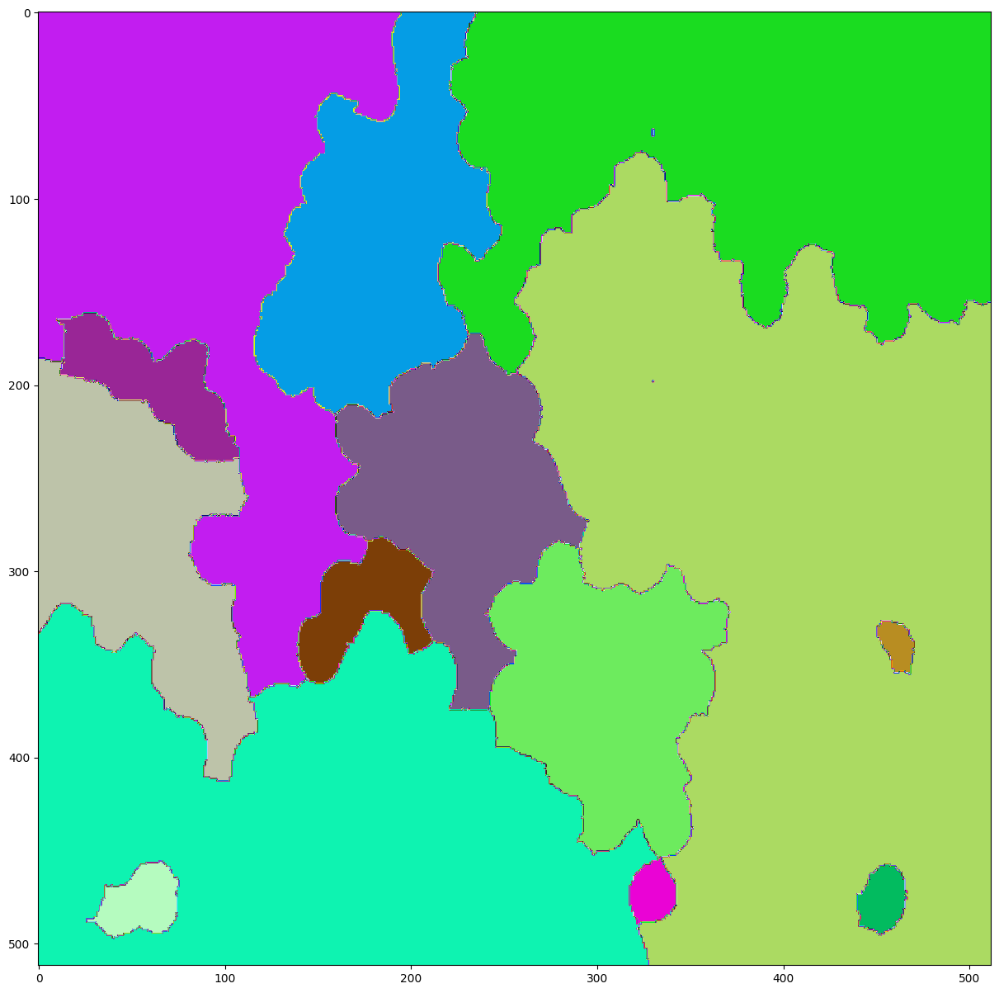

In [142]:
if student :
  wat_closing = seg.watershed(morpho.closing(morpho_grad, morpho.disk(5)),15)
plt.figure(figsize =(15,15))
plt.imshow(wat_closing,cmap =cmaprand)
plt.show()
#plt.figure(figsize=(15,15))
#plt.imshow(morpho_grad,cmap = "gray")
#plt.show()

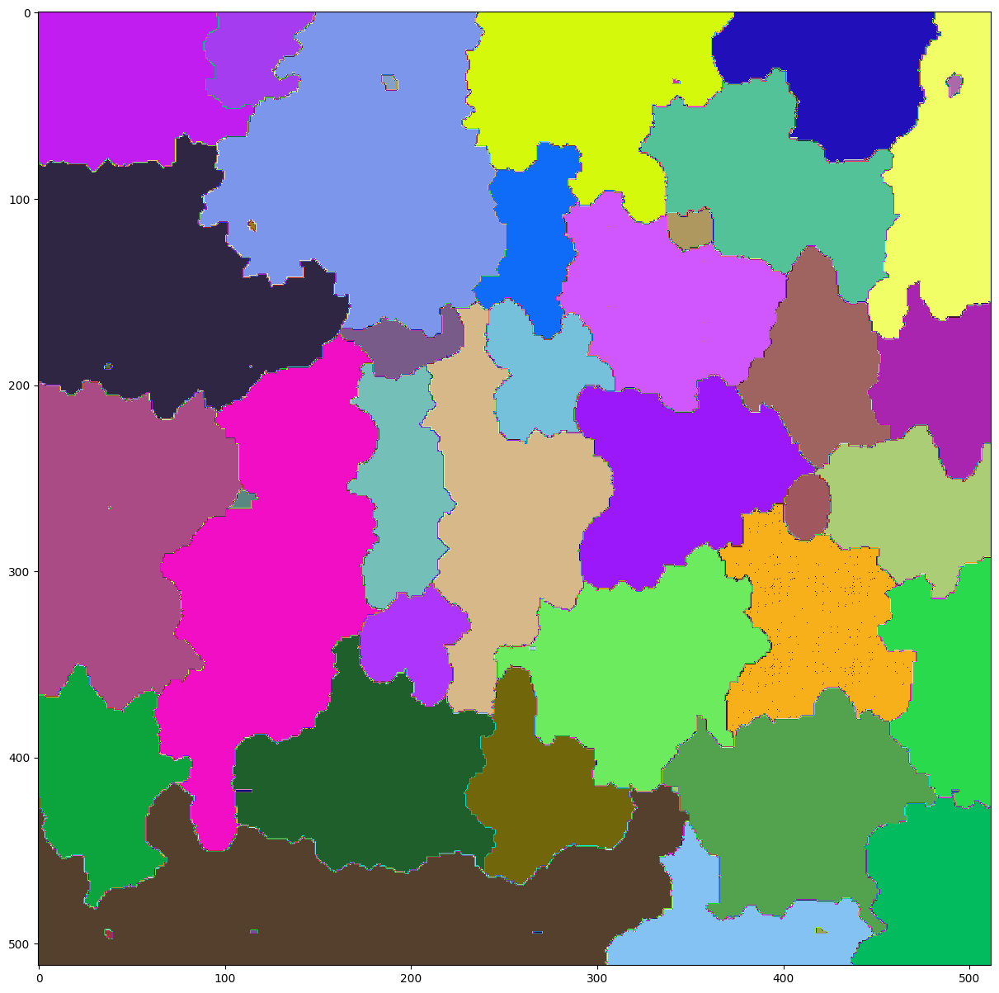

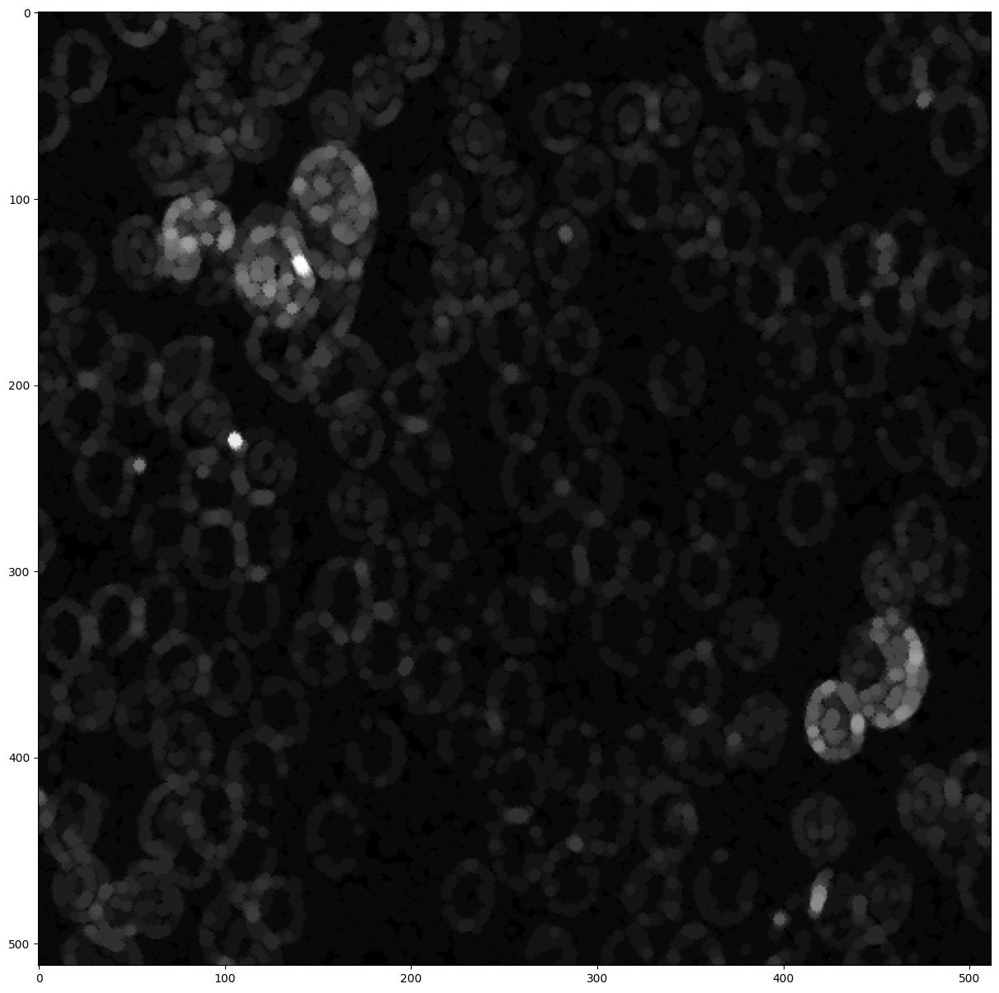

In [112]:
if student :
  wat_opening = seg.watershed(morpho.opening(morpho_grad, morpho.disk(3)),45)
plt.figure(figsize =(15,15))
plt.imshow(wat_opening,cmap =cmaprand)
plt.show()
plt.figure(figsize=(15,15))
plt.imshow(morpho.opening(morpho_grad, morpho.disk(3)),cmap = "gray")
plt.show()

Your objective is to try to do better than what you did with the closure and opening. To do that, we propose to use specific markers for the watershed transform.

**Q** : In the next cell, compute the reconstruction from an opening of the gradient. You can use as structuring element a disk of size 5. What do you observe ? Could it help you to efficiently segment the cells ?

**A** : On observe qu'en effectuant l'opération de reconstruction on a retrouvé la forme ronde caractéritique des cellules, toutefois on observe qu'il y a beaucoup de bruit, et que certaines cellules ont une intensité vraiment faible. Le fait de vouloir segmenter l'image me paraît impossible à cause de la quantité de bruit introduit.

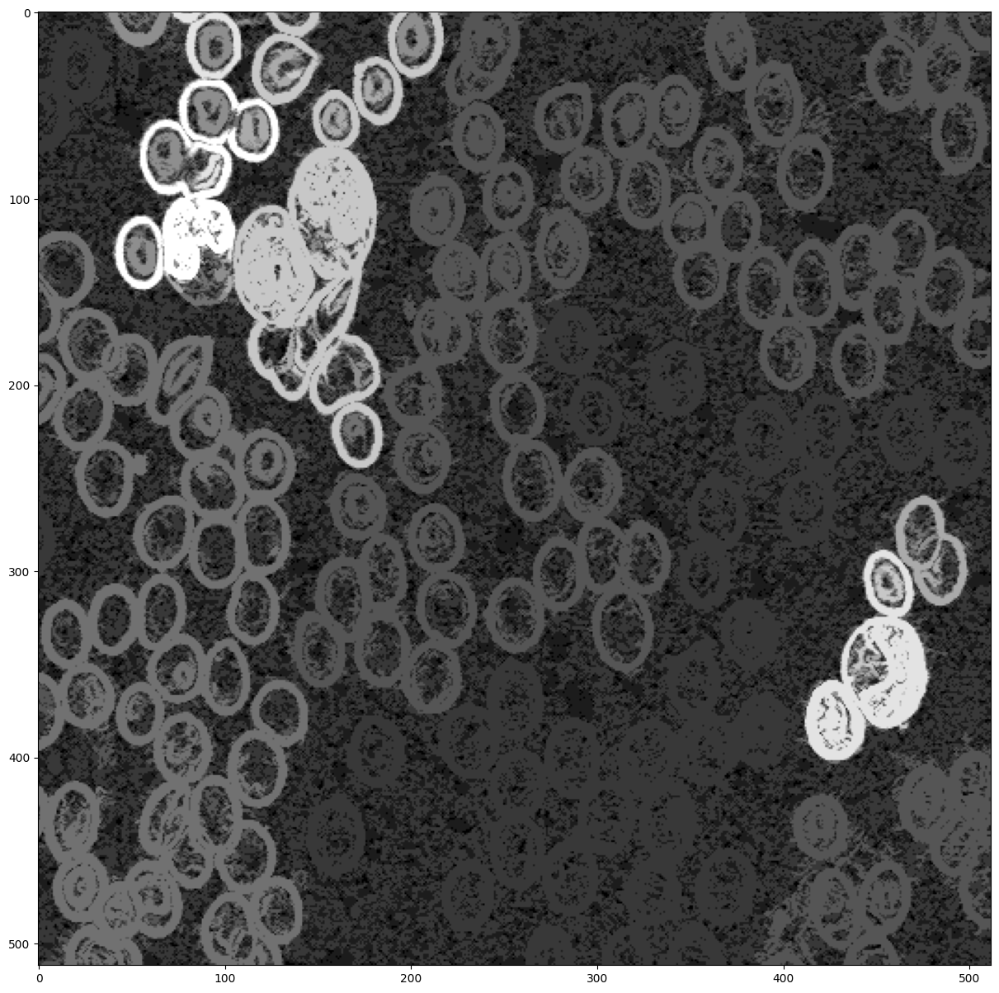

In [126]:
imOpen = morpho.opening(morpho_grad, morpho.disk(5))
reco=morpho.reconstruction(imOpen, morpho_grad)
plt.figure(figsize =(15,15))
plt.imshow(reco,cmap = "gray")
plt.show()

**Q** : In the next cell, compute the reconstruction from an closing of the gradient. You can use as structuring alement a disk of size 5. What do you observe ? Could it help you to efficiently segment the cells ?

**A** : La reconstruction a bien reconstruit les cellules, elle pourrait servir à les sgmenter.

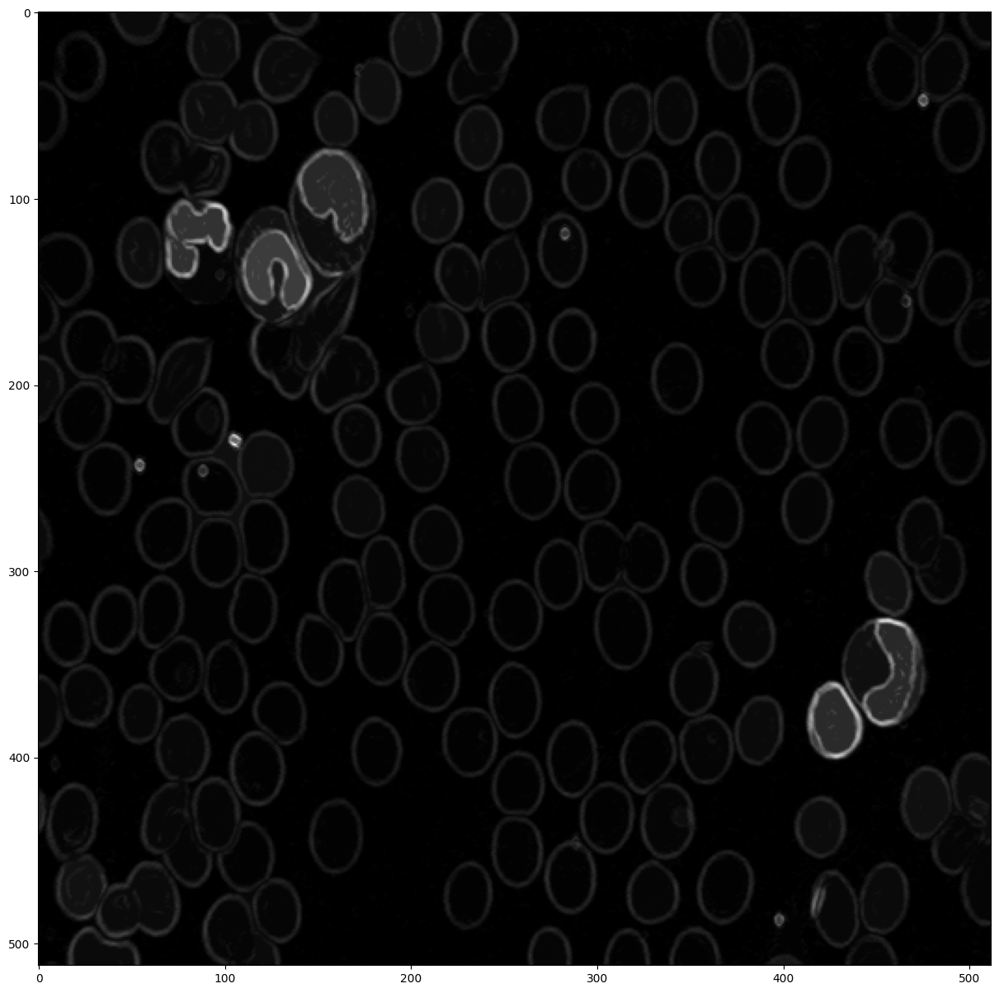

In [128]:
imClos = morpho.closing(morpho_grad, morpho.disk(5))
reco=morpho.reconstruction(imClos, morpho_grad,'erosion')
plt.figure(figsize =(15,15))
plt.imshow(reco,cmap = "gray")
plt.show()

**Q** : This last part is less guided. Use the reconstruction operation and the above questions to find good markers for the watershed algorithm. You could benefit from using the peak_local_max function of skimage.feature

In [139]:
#plt.figure(figsize =(15,15))
#plt.imshow(wat,cmap =cmaprand)
#plt.show()

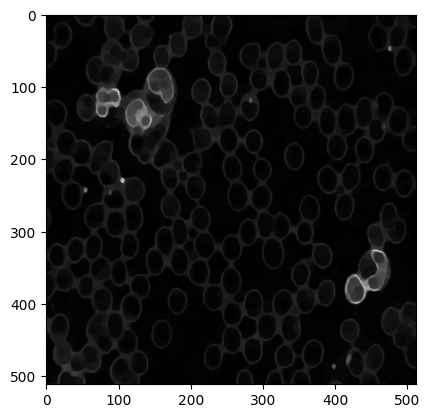

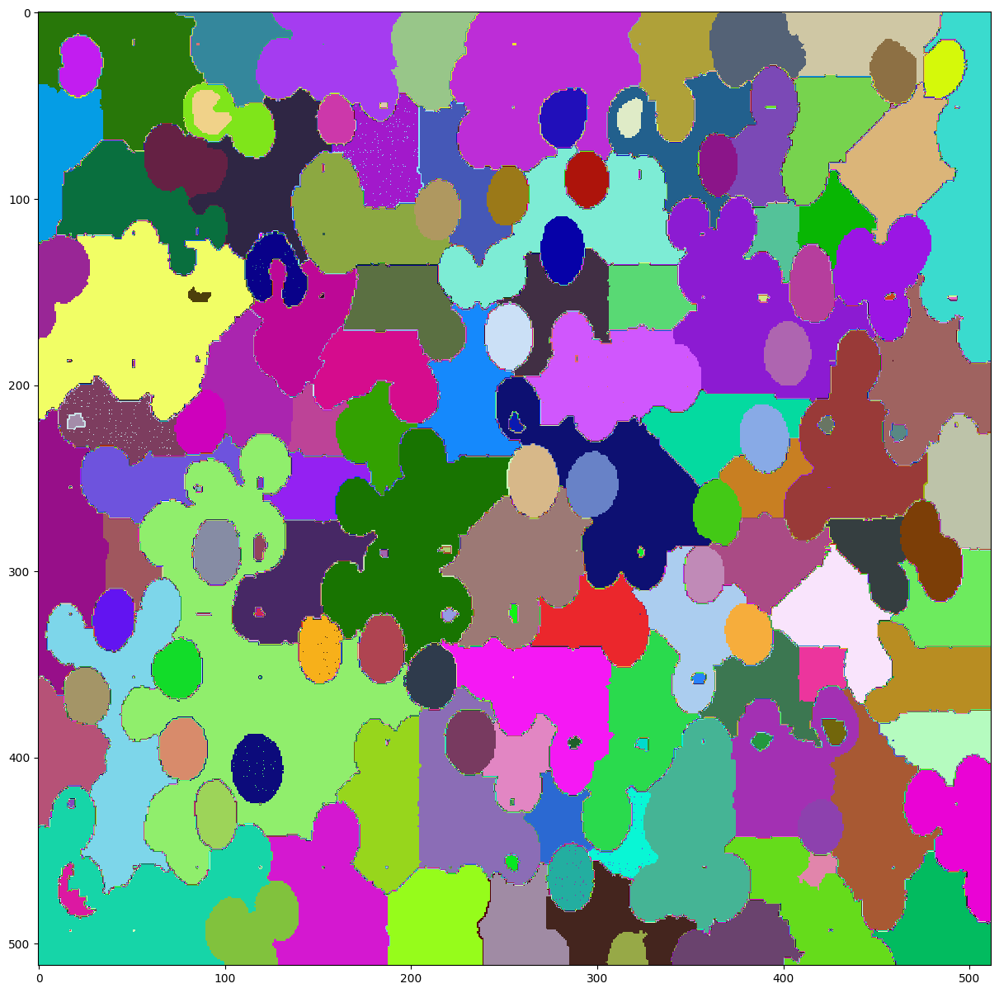

In [145]:
from skimage.feature import peak_local_max

a = morpho.closing(morpho_grad, morpho.disk(5))
plt.imshow(a,cmap ='gray')
plt.show()

reco=morpho.reconstruction(imClos, morpho_grad,'erosion')
b = peak_local_max(reco)
for i in range(len(b)):
  k,l=b[i][0],b[i][1]
  reco[k][l]= 255

#imOpen = morpho.opening(morpho_grad, morpho.disk(5))
#reco=morpho.reconstruction(imOpen, morpho_grad)

if student :
  wat_seg = seg.watershed(reco ,225)
plt.figure(figsize =(15,15))
plt.imshow(wat_seg,cmap =cmaprand)
plt.show()